In [1]:
!pip install sentence_transformers

     |████████████████████████████████| 79 kB 3.1 MB/s 
     |████████████████████████████████| 4.2 MB 32.6 MB/s 
     |████████████████████████████████| 1.2 MB 40.8 MB/s 
     |████████████████████████████████| 84 kB 3.1 MB/s 
     |████████████████████████████████| 6.6 MB 22.7 MB/s 
     |████████████████████████████████| 596 kB 42.3 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.0-py3-none-any.whl size=120747 sha256=2902c88da513bca8fdb3fc3251424b8c291b094d87edfebb305d171b2afd5551
  Stored in directory: /root/.cache/pip/wheels/83/c0/df/b6873ab7aac3f2465aa9144b6b4c41c4391cfecc027c8b07e7
Successfully built sentence-transformers
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [2]:
import pandas as pd
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

In [3]:
reviews = pd.read_csv('/content/Rbooks_df.csv')
reviews.groupby('LABEL')
reviews.head(5)

,Unnamed: 0,DOC_ID,LABEL,RATING,VERIFIED_PURCHASE,PRODUCT_CATEGORY,PRODUCT_ID,PRODUCT_TITLE,REVIEW_TITLE,REVIEW_TEXT
0,50,51,__label1__,4,N,Books,1593851286,The Mindful Way Through Depression: Freeing Yo...,Good book,I have begun using many of the techniques disc...
1,58,59,__label1__,1,N,Books,1594203369,The Most Dangerous Book: The Battle for James ...,A Day in the Life of a Century,"Ulysses Errata Once Penned<br /><br />""Ulysses..."
2,61,62,__label1__,1,N,Books,670026255,T.C. Boyle Stories II: The Collected Stories o...,Books for Album Covers,J. D Salinger was righteous...<br /><br />Not ...
3,138,139,__label1__,1,N,Books,1489559698,It Starts With Food CookBook: The Low Sugar Gl...,Go with the original,Customers are advised to go with the original ...
4,145,146,__label1__,1,N,Books,812995228,Among the Ten Thousand Things: A Novel,The Age of Dead Imagination,"I will write a short, shorter novel too it is ..."


In [4]:
df=reviews['LABEL']
label=list(df)
label_1=[]
label_2=[]
for i in range(0,700):
    if label[i]=='__label1__':
        label_1.append(label[i])
    else:
        label_2.append(label[i])



In [5]:
sentences = reviews['REVIEW_TEXT']

In [6]:
model = SentenceTransformer('bert-base-nli-mean-tokens')

Downloading:   0%|          | 0.00/391 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.95k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/625 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/438M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/399 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

In [7]:
sentence_vecs = model.encode(sentences)

In [8]:
arr=cosine_similarity(sentence_vecs,sentence_vecs)

In [9]:
node_1 = []
node_2 = []
for u in range(0,700) :
    for v in range(0,700) :
        if u!=v and arr[u,v]>0.75:
            node_1.append(reviews['REVIEW_TITLE'].loc[u])
            node_2.append(reviews['REVIEW_TITLE'].loc[v])
        else:
            node_1.append(reviews['REVIEW_TITLE'].loc[u])
            node_2.append(1)

In [10]:
df = pd.DataFrame(list(zip(node_1, node_2)),
               columns =['Column1', 'Column2'])
df

,Column1,Column2
0,Good book,1
1,Good book,1
2,Good book,1
3,Good book,1
4,Good book,1
...,...,...
489995,Great journal,1
489996,Great journal,1
489997,Great journal,1
489998,Great journal,1


In [11]:
import networkx as nx
G = nx.Graph()
import matplotlib.pyplot as plt

In [12]:
G = nx.from_pandas_edgelist(df, 'Column1', 'Column2')

In [13]:
G.remove_node(1)

In [14]:
nx.info(G)
num=G.number_of_nodes()

In [15]:
degrees1 = {node:val for (node, val) in G.degree()}
x= list(degrees1.keys())
val= list(degrees1.values())

In [16]:
li1=[]
li2=[]
for i in range(num):
    temp=0
    for j in range(700):
        if x[i]==reviews['REVIEW_TITLE'].iloc[j]:
            temp=reviews.iloc[j]['LABEL']
    if temp=='__label1__':
        li1.append('red')
    else:
        li2.append('green')

c=li1 + li2
len(c)

685

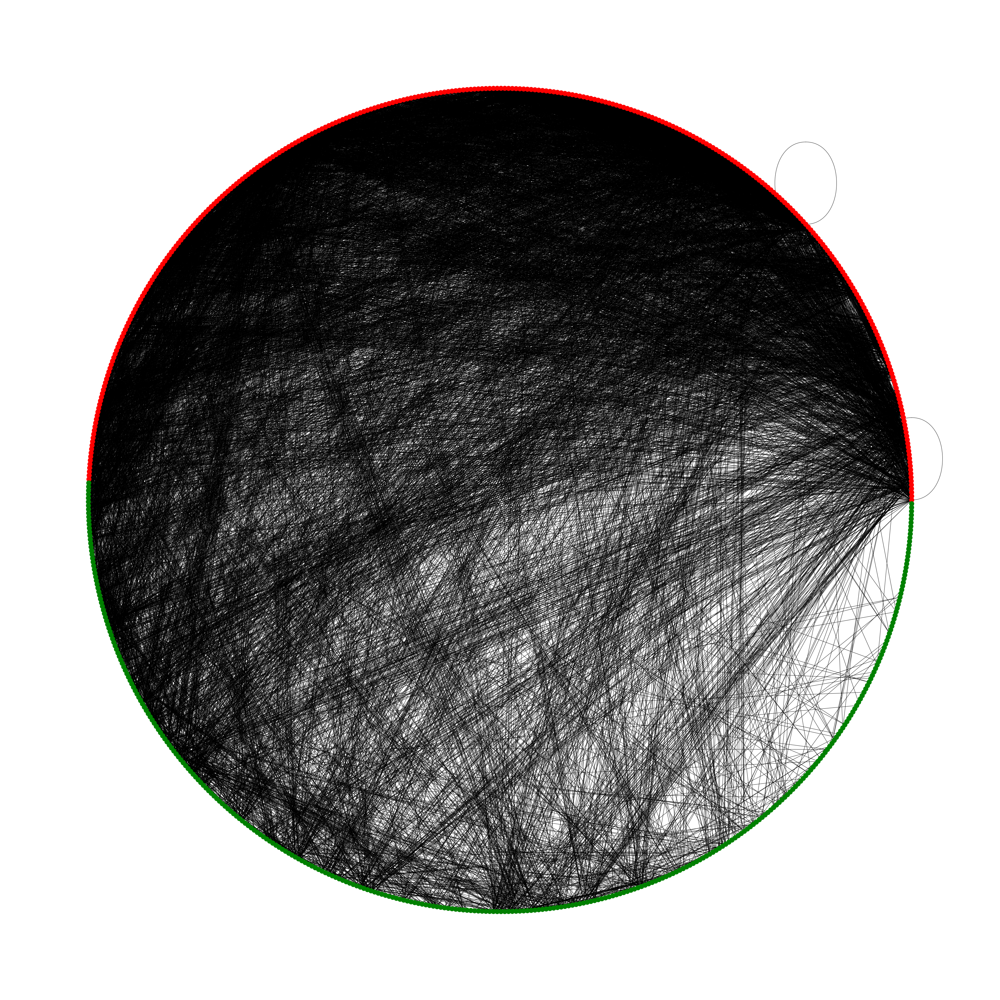

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [24]:
from matplotlib.pyplot import figure
figure(figsize=(50,50))
nx.draw_circular(G,node_color=c)
plt.show()
'''plt.savefig("BookscommonGraph_0.75.jpg")
plt.savefig("GCcommonGraph_0.75.png", format="PNG")'''
nx.write_gml(G,'BookscommonGraph_0.75.gml')
from google.colab import files
files.download('BookscommonGraph_0.75.gml')


In [25]:
nx.density(G)

0.043676100226234686

In [26]:
nx.number_connected_components(G)

69

In [27]:
real=list(dict(G.degree()).values())
from statistics import mean
mean(real)

29.874452554744526

In [28]:
nx.average_clustering(G)

0.4273425106466061

In [29]:

nx.transitivity(G)

0.38880876701930833